<center> Ambre Casanova, Roman Fuchs, Marjolaine Claret, David Bigan, Morgane Besnier </center>

# <center> <u> Projet en base de données relationnelles </u> </center>
 <center> <u> <b>Sujet :</u> Etude des facteurs influençant la disparition des populations d’abeilles européennes au cours des années 2012 à 2014 </center>

<br>

*Problématique : Les facteurs et acteurs clefs dans le maintien des populations d’abeilles européennes.*

![](images/epilobee.png)

- Importation des bibliothèques

In [2]:
import os
import pandas as pd

# maths 
import numpy as np
import numpy.random as nr

# affichage/ graphiques 
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Image

- Ouverture et lecture du fichier 

[Lien vers le site de téléchargement du dataset .xlsx du programme EPILOBEE](https://data.europa.eu/euodp/en/data/dataset/honey-bee-seasonal-mortality-2012-2014-epilobee-analysis)

In [60]:
df = pd.read_excel("epilobee.xlsx", header = 0, na_values = '' )

# Présentation du dataset

In [61]:
print("EPILOBEE est un dataset regroupant les valeurs pour", df.shape[1], "mesures réalisées dans", df.shape[0] ,"ruchers.")

EPILOBEE est un dataset regroupant les valeurs pour 39 mesures réalisées dans 4758 ruchers.


In [3]:
print("La 1ère année", sum(df["Program"]=="First Year"), "ruchers on été visités et", df.shape[0]-sum(df["Program"]=="First Year"), "la 2nde année.")

La 1ère année 2332 ruchers on été visités et 2426 la 2nde année.


In [4]:
df.head()

,ID_api,Seasonal_mortality,Age,Activity,Beekeep_for,Qualif,Training,Coop_treat,Bee_population_size,Country,...,Environment,VarroosisV2,ChronicParalysisV2,AmericanFoulbroodV2,NosemosisV2,EuropeanFoulbroodV2,Migration,Merger,Winter_Mortality_Class,Program
0,1000_A,0,4___Over 65,Part_time,2___2-5 years,No,Yes,Yes,1___Less than 51 colonies,LATVIA,...,Diverse,Not_Suffering,Not_Suffering,Not_Suffering,Not_Suffering,Not_Suffering,No,No,5__21 - 50 %,First Year
1,1003_A,0,4___Over 65,Hobby,3___More than 5 years,No,Yes,Yes,1___Less than 51 colonies,LATVIA,...,Diverse,Not_Suffering,Not_Suffering,Not_Suffering,Not_Suffering,Not_Suffering,No,No,5__21 - 50 %,First Year
2,1004_A,0,1___Less than 30,Part_time,1___Less than 2 years,No,No,No,2___51 - 100,GREECE,...,Farmland,Not_Suffering,Not_Suffering,Not_Suffering,Not_Suffering,Not_Suffering,No,No,1__No Mortality,First Year
3,1006_A,0,4___Over 65,Hobby,3___More than 5 years,No,No,Yes,1___Less than 51 colonies,SLOVAKIA,...,Diverse,Not_Suffering,Not_Suffering,Not_Suffering,Not_Suffering,Not_Suffering,No,No,1__No Mortality,First Year
4,1007_A,0,4___Over 65,Hobby,2___2-5 years,No,No,Yes,1___Less than 51 colonies,SLOVAKIA,...,Wood,Not_Suffering,Not_Suffering,Not_Suffering,Not_Suffering,Not_Suffering,No,No,5__21 - 50 %,First Year


## Aire géographique couverte

In [54]:
# pays
print("\n Les colonies d'abeilles proviennent de",df['Country'].nunique(), " pays différents:")
print(df['Country'].unique())


 Les colonies d'abeilles proviennent de 16  pays différents:
['LATVIA' 'GREECE' 'SLOVAKIA' 'POLAND' 'ESTONIA' 'ENGLAND & WALES'
 'FINLAND' 'LITHUANIA' 'SWEDEN' 'ITALY' 'GERMANY' 'FRANCE' 'HUNGARY'
 'DENMARK' 'BELGIUM' 'SPAIN']


## Espèces d'abeilles étudiées

In [55]:
# especes d'abeilles etudiees
print("\n L'étude a été faite sur" ,df['Breed'].nunique(),"espèces d'abeilles différentes:")


 L'étude a été faite sur 8 espèces d'abeilles différentes:


Les espèces d'abeilles suivantes ont été répertoriées :

 A. m. mellifera


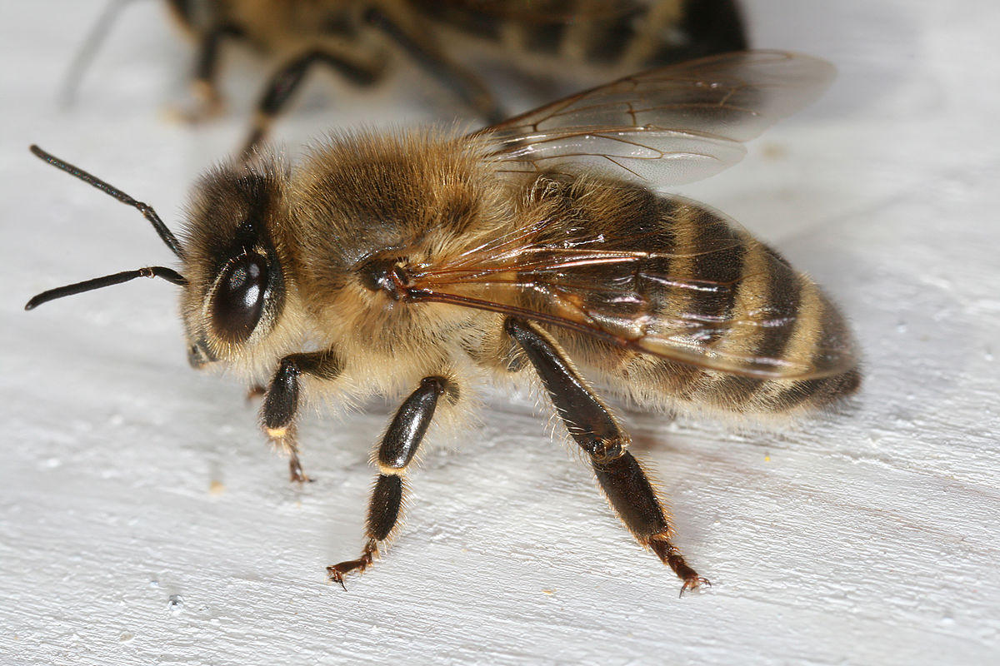

In [6]:
print("Les espèces d'abeilles suivantes ont été répertoriées :\n\n",df["Breed"].unique()[0])
Image(filename = "images/amellifera.jpg", width=300, height=100)

A. m. ccm


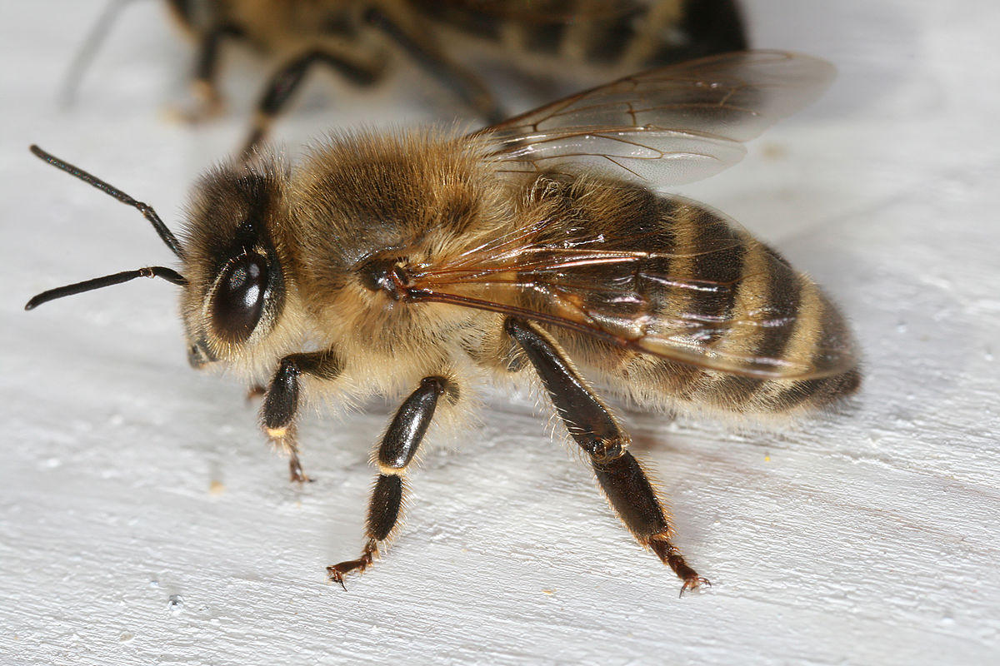

In [7]:
print(df["Breed"].unique()[1])
Image(filename = "images/amellifera.jpg", width=300, height=100)

A. m. carnica


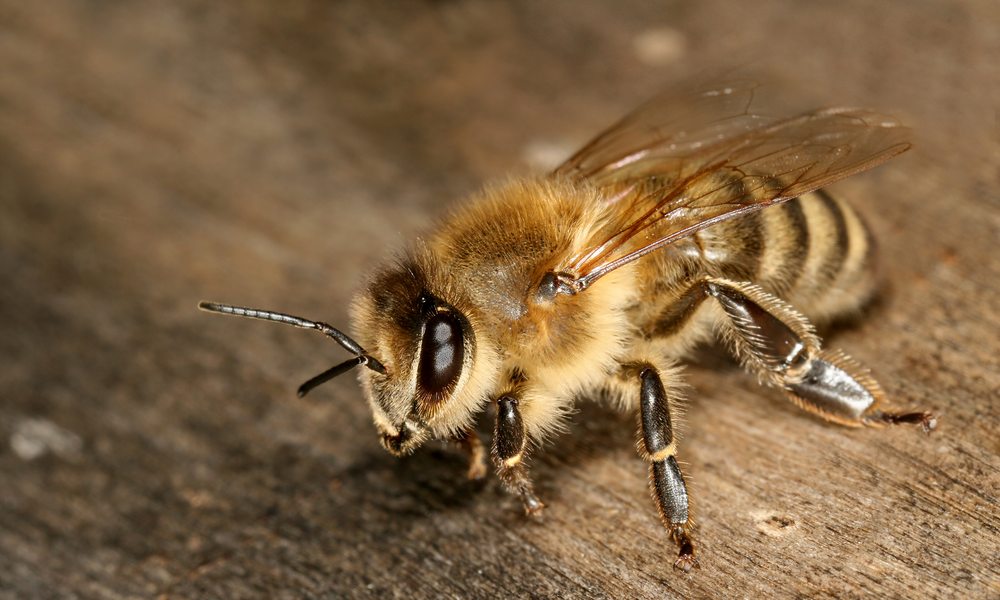

In [8]:
print(df["Breed"].unique()[2])
Image(filename = "images/acarnica.jpg", width=300, height=100)

Hybrid


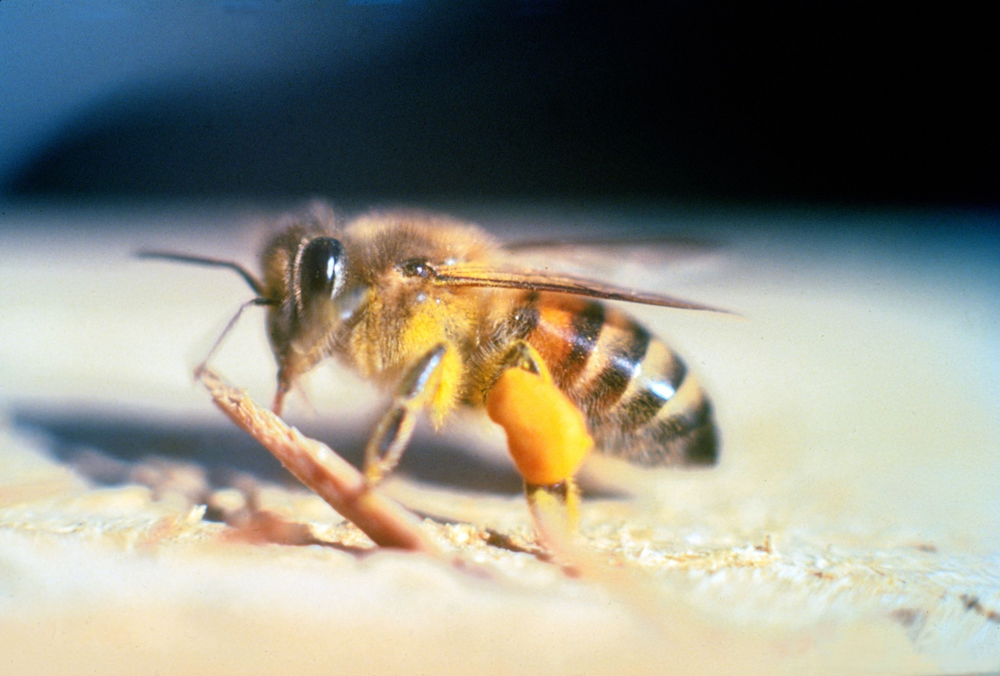

In [9]:
print(df["Breed"].unique()[3])
Image(filename = "images/hybrid.jpg", width=300, height=100)

Buckfast


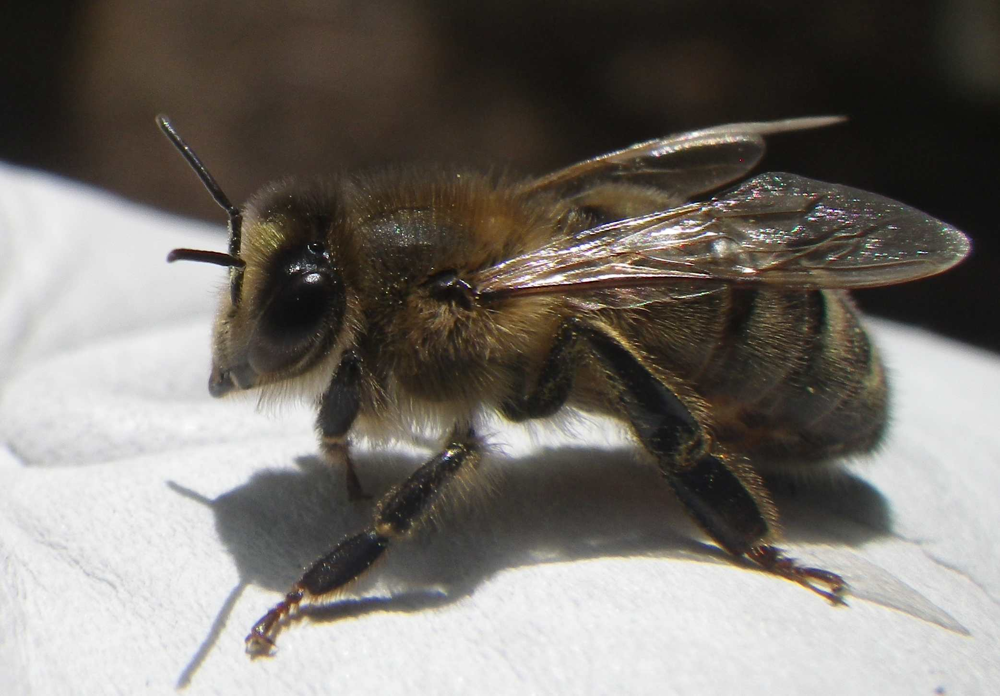

In [10]:
print(df["Breed"].unique()[4])
Image(filename = "images/buckfast.jpg", width=300, height=100)

A. m. ligustica


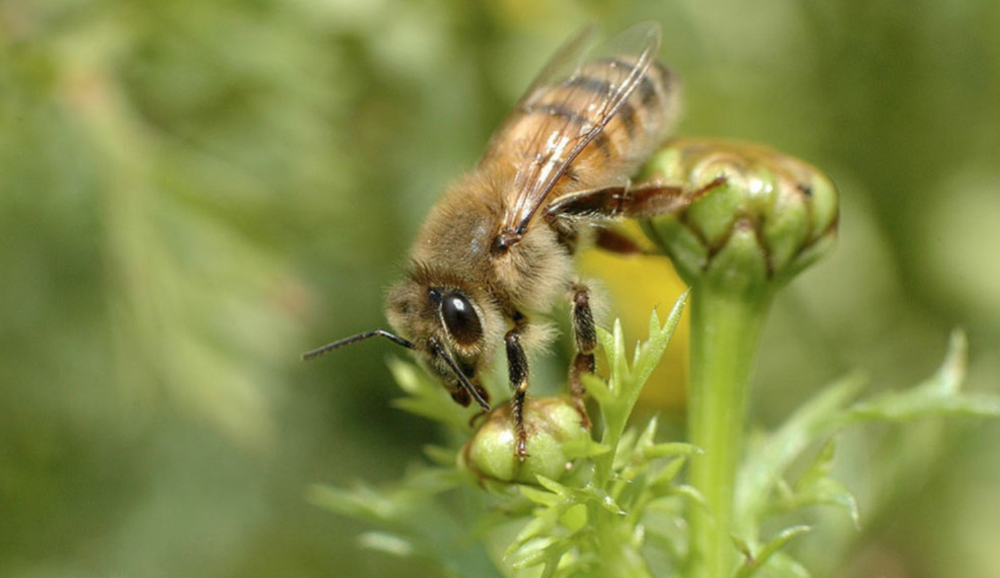

In [11]:
print(df["Breed"].unique()[5])
Image(filename = "images/lingustica.png", width=300, height=100)

Local bees


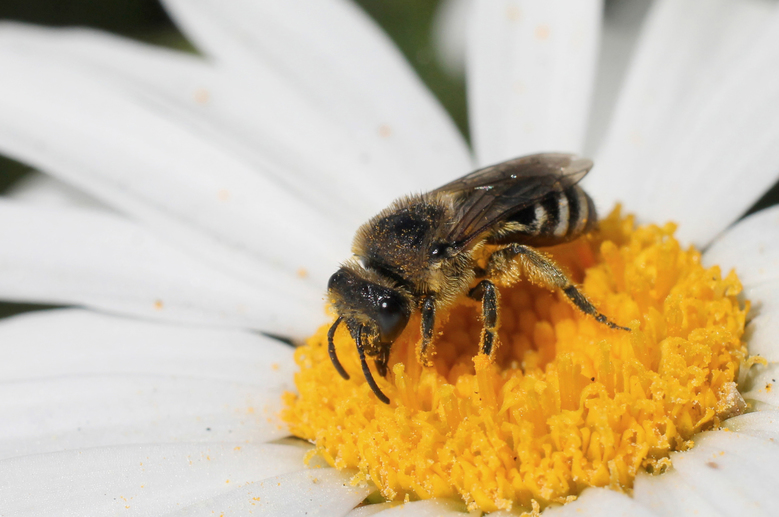

In [12]:
print(df["Breed"].unique()[6])
Image(filename = "images/local.jpg", width=300, height=100)

A. m. iberiensis


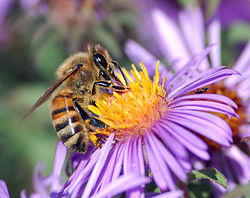

In [13]:
print(df["Breed"].unique()[7])
Image(filename = "images/iberiensis.jpg", width=300, height=100)

## Paramètres mesurés

Les différents paramètres mesurés :

In [14]:
print("EPILBOEE a étudié", len(df.columns.tolist()), "paramètres \n")
print("Liste des paramètres mesurés :\n\n", df.columns.tolist())

EPILBOEE a étudié 39 paramètres 

Liste des paramètres mesurés :

 ['ID_api', 'Seasonal_mortality', 'Age', 'Activity', 'Beekeep_for', 'Qualif', 'Training', 'Coop_treat', 'Bee_population_size', 'Country', 'Apiary_Size', 'Production', 'Apiarist_book', 'Org_member', 'Continue', 'Breed', 'Chronic_Depop', 'ClinSign_Brood', 'ClinSign_Honeybees', 'H_Rate_ColMortality', 'H_Rate_HoneyMortality', 'OtherEvent', 'VarroaMites', 'QueenProblems', 'Management', 'Swarm_bought', 'Swarm_produced', 'Queen_bought', 'Queen_produced', 'Environment', 'VarroosisV2', 'ChronicParalysisV2', 'AmericanFoulbroodV2', 'NosemosisV2', 'EuropeanFoulbroodV2', 'Migration', 'Merger', 'Winter_Mortality_Class', 'Program']


![](images/deroulement.png)

# Exploration des variables

## Description des variables

### Apiculteur 

 . <u>Age</u> : âge de l'apiculteur

 . <u>Training</u> : indique si l'apiculteur a suivi une formation d'apiculture et/ou sur la santé des abeilles durant les 3 dernières années
 
  . <u>Beekeep_for</u> : nombre d'années d'expérience en temps qu'apiculteur
 
 . <u>Coop_treat</u> : indique si l'apiculteur fait parti d'une coopérative qui lutte contre le varrao (parasite qui tue les abeilles) avec les apiculteurs voisins
 
 . <u>Activity</u> : nature de l'activité de l'apiculteur
 
 . <u>Migration</u> : indique si le rucher a migré au moins une fois durant la dernière période apicole
 
 . <u>Apiarist_book</u> : indique si l'apiculteur possède des livres sur l'apiculture
 
 . <u>Org_member</u> : indique si l'apiculteur fait partie d'une organisation d'apiculteur régionale ou nationale
 
 . <u>Continue</u> : indique si l'apiculteur va continuer son activité sur plus de deux ans
 
 . <u>Production</u> : le type de production de l'apiculteur

In [78]:
df["Beekeep_for"].unique()

array(['2___2-5 years', '3___More than 5 years', '1___Less than 2 years'],
      dtype=object)

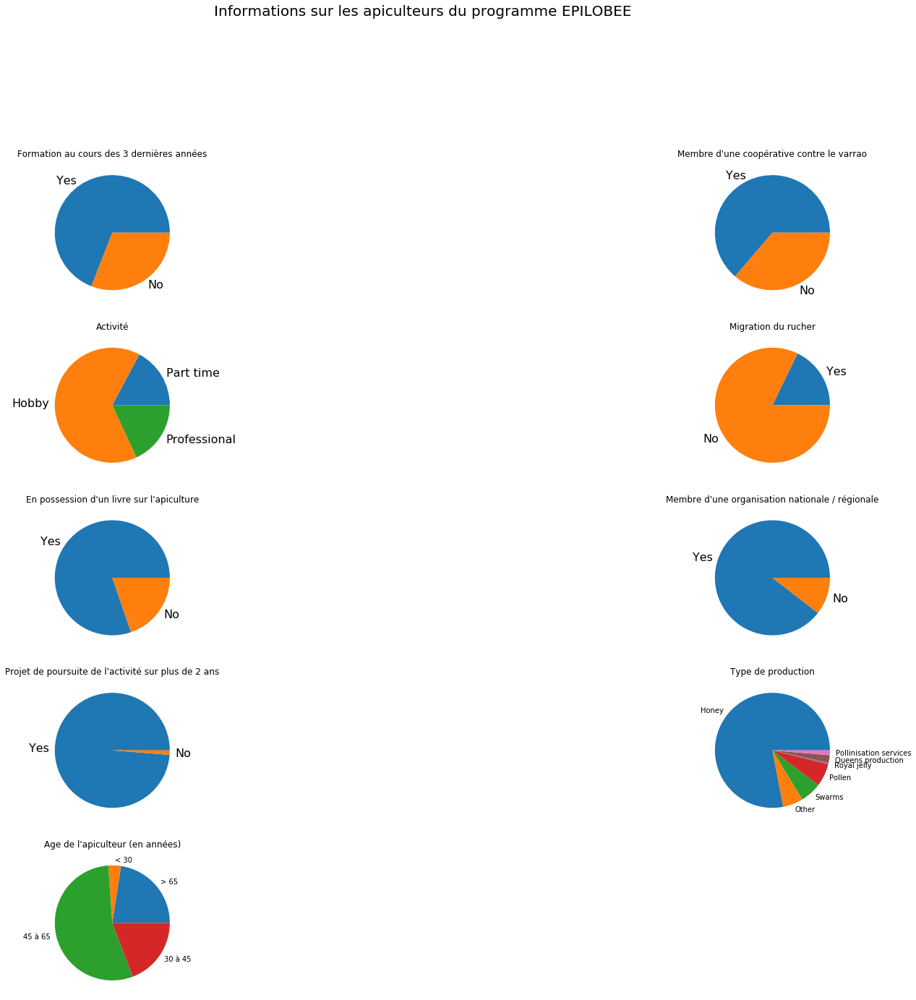

In [80]:
plt.figure(figsize = (30, 30)) 

# variable Training 
training_yes = df['Training'].eq("Yes").sum()
training_no = df['Training'].eq("No").sum()
training=[training_yes,training_no]

plt.subplot(721)
plt.pie(training, textprops={'fontsize': 16}, labels  = ['Yes','No'])
plt.title('Formation au cours des 3 dernières années')

# variable Coop_treat
Coop_treat_yes = df['Coop_treat'].eq("Yes").sum()
Coop_treat_no = df['Coop_treat'].eq("No").sum()
coop_treat = [Coop_treat_yes,Coop_treat_no]

plt.subplot(722)
plt.pie(coop_treat, textprops={'fontsize': 16}, labels  = ['Yes','No'])
plt.title("Membre d'une coopérative contre le varrao")

# variable Activity
activity_Part_time = df['Activity'].eq("Part_time").sum()
activity_Hobby = df['Activity'].eq("Hobby").sum()
activity_Professional = df['Activity'].eq("Professional").sum()
activity = [activity_Part_time,activity_Hobby,activity_Professional]

plt.subplot(723)
plt.pie(activity, textprops={'fontsize': 16}, labels  = ['Part time','Hobby','Professional'])
plt.title('Activité')

# variable Migration
migration_yes = df['Migration'].eq("Yes").sum()
migration_no = df['Migration'].eq("No").sum()
migration = [migration_yes,migration_no]

plt.subplot(724)
plt.pie(migration, textprops={'fontsize': 16}, labels  = ['Yes','No'])
plt.title('Migration du rucher')

# variable Apiarist_book
Apiarist_book_yes = df['Apiarist_book'].eq("Yes").sum()
Apiarist_book_no = df['Apiarist_book'].eq("No").sum()
apiarist_book = [Apiarist_book_yes,Apiarist_book_no]

plt.subplot(725)
plt.pie(apiarist_book, textprops={'fontsize': 16}, labels  = ['Yes','No'])
plt.title("En possession d'un livre sur l'apiculture")

# variable Org_member
Org_member_yes = df['Org_member'].eq("Yes").sum()
Org_member_no = df['Org_member'].eq("No").sum()
Org_member = [Org_member_yes,Org_member_no]

plt.subplot(726)
plt.pie(Org_member, textprops={'fontsize': 16}, labels  = ['Yes','No'])
plt.title("Membre d'une organisation nationale / régionale")

# variable Continue
Continue_yes = df['Continue'].eq("Yes").sum()
Continue_no = df['Continue'].eq("No").sum()
Continue = [Continue_yes,Continue_no]

plt.subplot(727)
plt.pie(Continue, textprops={'fontsize': 16}, labels  = ['Yes','No'])
plt.title("Projet de poursuite de l'activité sur plus de 2 ans")

# variable Production
honey = df['Production'].eq("01__Only honey").sum()
other = df['Production'].eq("07__Other").sum()
swarms = df['Production'].eq("06__Includes swarms production").sum()
pollen = df['Production'].eq("02__Includes pollen production").sum()
jelly = df['Production'].eq("05__Includes royal jelly production").sum()
queens = df['Production'].eq("04__Includes queens production").sum()
pollinis = df['Production'].eq("03__Includes pollination services").sum()
Production = [honey,other, swarms, pollen, jelly, queens, pollinis]

plt.subplot(728)
plt.pie(Production, textprops={'fontsize': 10}, labels  = ['Honey','Other', 'Swarms', 'Pollen', 'Royal jelly', 'Queens production', 'Pollinisation services'])
plt.title("Type de production")

# variable Age 
over65 = df['Age'].eq("4___Over 65").sum()
less30 = df['Age'].eq("1___Less than 30").sum()
fortyfive_sixtyfive = df['Age'].eq("3___45-65").sum()
thirty_fortyfive = df['Age'].eq("2___30-45").sum()
age=[over65, less30, fortyfive_sixtyfive, thirty_fortyfive]

plt.subplot(729)
plt.pie(age, textprops={'fontsize': 10}, labels  = ['> 65','< 30', '45 à 65', '30 à 45'])
plt.title("Age de l'apiculteur (en années)")

# variable Beekeep_for 
two_five = df['Beekeep_for'].eq("2___2-5 years").sum()
over_five = df['Beekeep_for'].eq("3___More than 5 years").sum()
less_two = df['Beekeep_for'].eq("1___Less than 2 years").sum()
beekeep_for=[two_five, over_five, less_two]

plt.suptitle("Informations sur les apiculteurs du programme EPILOBEE", fontsize=20)
plt.show()

### Colonies 


 . <u>Breed</u> : indique l'espèce de l'abeille
 
 . <u>Environment</u> : indique le type d'environnement dans lequel se trouve la colonie
 
 . <u>Bee_population_size</u> : nombre de colonies possédées par l'apiculteur
 
 . <u>Apiary_Size</u> : nombre de colonies dans le rucher
 
 . <u>ClinSign_Honeybees</u> : indique si des abeilles à miel ont présenté des signes de maladies avant le lancement du programme
 
  . <u>Chronic_Depop</u> : indique si la colonie a présenté des signes de dépopulation chronique avant le lancement du programme
 
 . <u>Swarm_produced</u> : nombre de larves produite par l'apiculteur
  
 . <u>Swarm_bought</u> : nombre de larves achetées par l'apiculteur
 
  . <u>Queen_produced</u> : nombre de reines produite par l'apiculteur
  
  . <u>Queen_bought</u> : nombre de reines achetées par l'apiculteur
  
  . <u>Seasonal_mortality</u> : quantifie les pertes de colonies durant la période apicole

  . <u>Winter_Mortality_Class</u> : quantifie les pertes de colonies durant la période hivernale

  . <u>H_Rate_ColMortality</u> : indique si la colonie a subi une haute mortalité (>10%) avant le lancement du programme
  
  . <u>H_Rate_ColMortality</u> : indique si la colonie a subi une forte baisse de la production de miel avant le lancement du programme

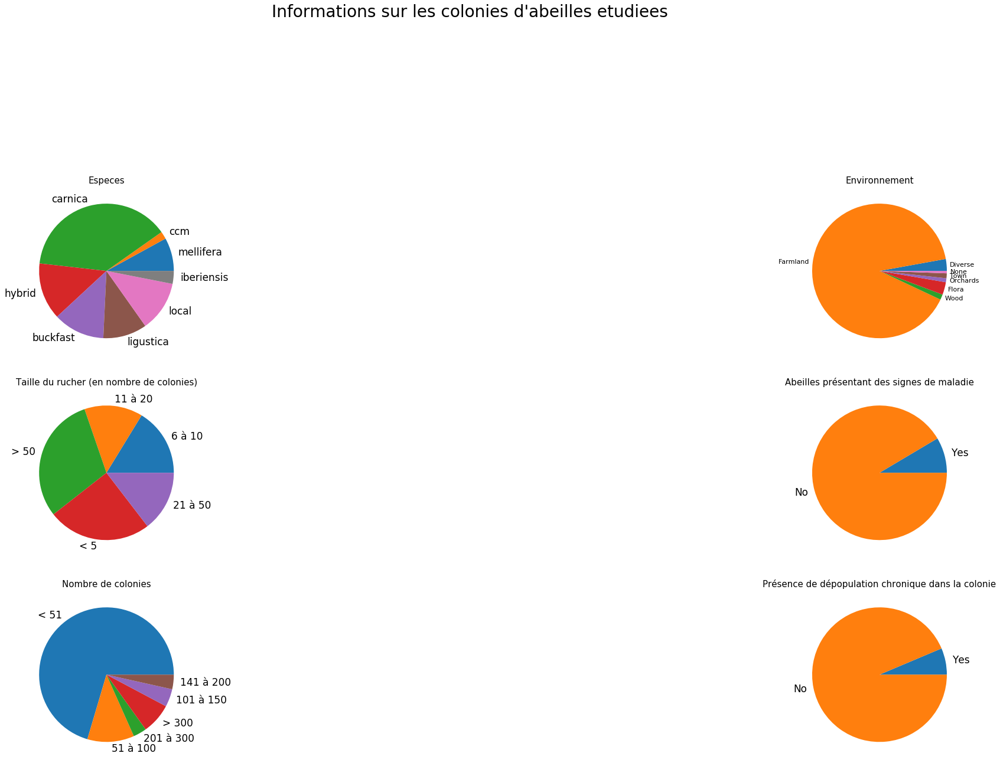

In [88]:
plt.figure(figsize = (43, 43)) 

# variable Breed 
mellifera = df['Breed'].eq("A. m. mellifera").sum()
ccm = df['Breed'].eq("A. m. ccm").sum()
carnica = df['Breed'].eq("A. m. carnica").sum()
hybrid = df['Breed'].eq("Hybrid").sum()
buckfast = df['Breed'].eq("Buckfast").sum()
ligustica = df['Breed'].eq("A. m. ligustica").sum()
local = df['Breed'].eq("Local bees").sum()
iberiensis = df['Breed'].eq("A. m. iberiensis").sum()
species=[mellifera, ccm, carnica, hybrid, buckfast, ligustica, local, iberiensis]

plt.subplot(721)
plt.pie(species, textprops={'fontsize': 17}, labels  = ['mellifera', 'ccm', 'carnica', 'hybrid', 'buckfast', 'ligustica', 'local', 'iberiensis'])
plt.title('Especes', fontsize = 15)

# variable Environment 
Farmland = df['Environment'].eq("Farmland").sum()
Diverse = df['Environment'].eq("Diverse").sum()
Wood = df['Environment'].eq("Wood").sum()
Flora = df['Environment'].eq("Flora").sum()
Orchards = df['Environment'].eq("Orchards").sum()
Town = df['Environment'].eq("Town").sum()
No = df['Environment'].eq("None").sum()
environment=[Farmland, Diverse, Wood, Flora, Orchards, Town, No]

plt.subplot(722)
plt.pie(environment, labeldistance=1.05, textprops={'fontsize': 11}, labels  = ['Diverse', 'Farmland', 'Wood', 'Flora', 'Orchards', 'Town', 'None'])
plt.title('Environnement', fontsize = 15)

# variable Apiary_Size 
six_ten = df['Apiary_Size'].eq("2__6 - 10").sum()
elev_twenty = df['Apiary_Size'].eq("3__11 - 20").sum()
over_fifty = df['Apiary_Size'].eq("5__More than 50 colonies").sum()
less_five = df['Apiary_Size'].eq("1__Less than 5 colonies").sum()
twentyone_fifty = df['Apiary_Size'].eq("4__21 - 50").sum()
apiary_size=[six_ten, elev_twenty, over_fifty, less_five, twentyone_fifty]

plt.subplot(723)
plt.pie(apiary_size, labeldistance=1.1, textprops={'fontsize': 17}, labels  = ['6 à 10', '11 à 20', '> 50', '< 5', '21 à 50'])
plt.title('Taille du rucher (en nombre de colonies)', fontsize = 15)

# variable ClinSign_Honeybees
clinsign_yes = df['ClinSign_Honeybees'].eq("Yes").sum()
clinsign_no = df['ClinSign_Honeybees'].eq("No").sum()
clinsign = [clinsign_yes,clinsign_no]

plt.subplot(724)
plt.pie(clinsign, labeldistance=1.1, textprops={'fontsize': 17}, labels  = ['Yes', 'No'])
plt.title('Abeilles présentant des signes de maladie', fontsize = 15)

# variable Bee_population_size
less_fiftyone = df['Bee_population_size'].eq("1___Less than 51 colonies").sum()
fiftyone_hundred = df['Bee_population_size'].eq("2___51 - 100").sum()
twohundred_threehund = df['Bee_population_size'].eq("5___201 - 300").sum()
over_treehund = df['Bee_population_size'].eq("6___More than 300 colonies").sum()
hundredone_hundredfifty = df['Bee_population_size'].eq("3___101 - 150").sum()
hundredfifty_twohundred = df['Bee_population_size'].eq("4___151 - 200").sum()
bee_pop = [less_fiftyone, fiftyone_hundred, twohundred_threehund, over_treehund, hundredone_hundredfifty, hundredfifty_twohundred]

plt.subplot(725)
plt.pie(bee_pop, labeldistance=1.1, textprops={'fontsize': 17}, labels  = ['< 51', '51 à 100', '201 à 300', '> 300', '101 à 150', '141 à 200'])
plt.title('Nombre de colonies', fontsize = 15)

# variable Chronic_Depop
chronic_yes = df['Chronic_Depop'].eq("Yes").sum()
chronic_no = df['Chronic_Depop'].eq("No").sum()
chronic_depop = [chronic_yes, chronic_no]

plt.subplot(726)
plt.pie(chronic_depop, labeldistance=1.1, textprops={'fontsize': 17}, labels  = ['Yes', 'No'])
plt.title('Présence de dépopulation chronique dans la colonie', fontsize = 15)

# variable Chronic_Depop
chronic_yes = df['Chronic_Depop'].eq("Yes").sum()
chronic_no = df['Chronic_Depop'].eq("No").sum()
chronic_depop = [chronic_yes, chronic_no]

plt.subplot(726)
plt.pie(chronic_depop, labeldistance=1.1, textprops={'fontsize': 17}, labels  = ['Yes', 'No'])
plt.title('Présence de dépopulation chronique dans la colonie', fontsize = 15)

plt.suptitle("Informations sur les colonies d'abeilles etudiees", fontsize=28)
plt.show()

Parmi ces paramètres, nous allons nous intéresser en particulier à la mortalité des abeilles :

In [41]:
for k in range(len(df.columns.tolist())) :
    if ("mortality" in df.columns.tolist()[k]) or ("Mortality" in df.columns.tolist()[k]):
        print(df.columns.tolist()[k])

Seasonal_mortality
H_Rate_ColMortality
H_Rate_HoneyMortality
Winter_Mortality_Class


$\to$ 2 types de taux de mortalité ont été calculés : 
- Le taux de mortalité hivernal : quantifie les pertes de colonies durant l'hiver
- Le taux de mortalité saisonnier : quantifie les pertes de colonies durant la période apicole

### Maladies et parasites


 . <u>EuropeanFoulbroodV2</u> : indique la colonie souffre de la loque européenne au printemps
 
 . <u>NosemosisV2</u> : indique la colonie souffre de la nosémose au printemps
 
 . <u>AmericanFoulbroodV2</u> : indique la colonie souffre de la loque américaine au printemps
 
 . <u>ChronicParalysisV2</u> : indique la colonie souffre de paralysie chronique au printemps
 
 . <u>VarroosisV2</u> : indique la colonie souffre de varroosise au printemps
 
  . <u>VarroaMites</u> : indique si la colonie est atteint du parasite varroa

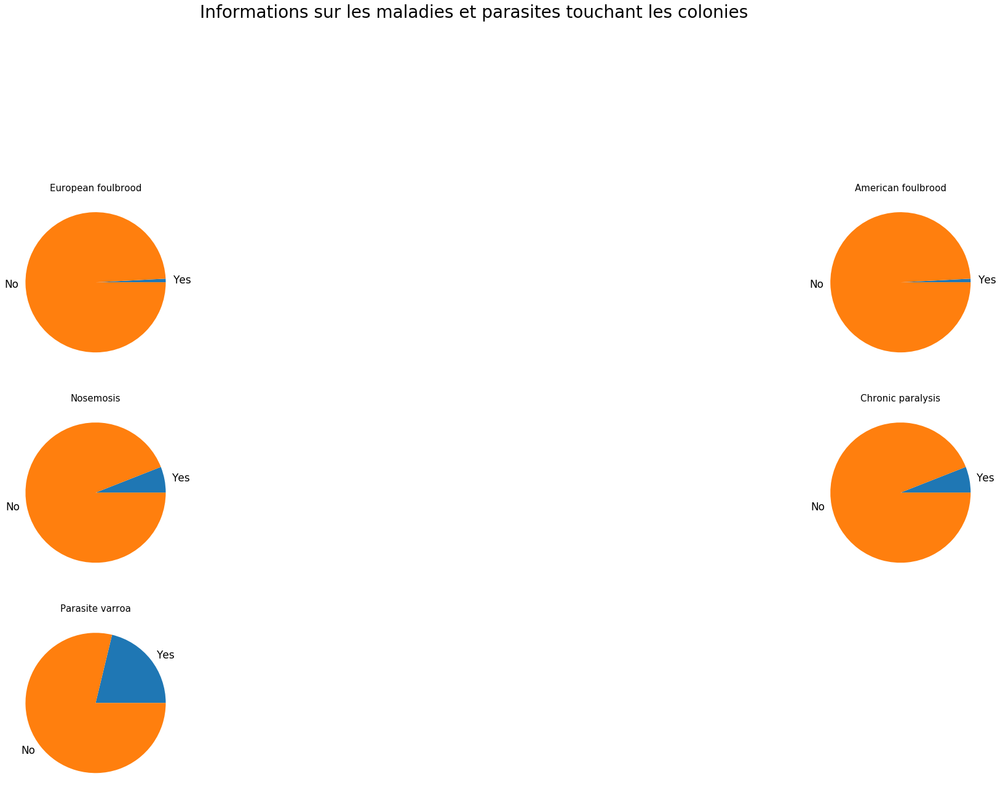

In [97]:
plt.figure(figsize = (43, 43)) 

# variable EuropeanFoulbroodV2
EU_yes = df['EuropeanFoulbroodV2'].eq("Suffering").sum()
EU_no = df['EuropeanFoulbroodV2'].eq("Not_Suffering").sum()
EU = [EU_yes,EU_no]

plt.subplot(721)
plt.pie(EU, labeldistance=1.1, textprops={'fontsize': 17}, labels  = ['Yes', 'No'])
plt.title('European foulbrood', fontsize = 15)

# variable AmericanFoulbroodV2
USA_yes = df['AmericanFoulbroodV2'].eq("Suffering").sum()
USA_no = df['AmericanFoulbroodV2'].eq("Not_Suffering").sum()
USA = [USA_yes, USA_no]

plt.subplot(722)
plt.pie(EU, labeldistance=1.1, textprops={'fontsize': 17}, labels  = ['Yes', 'No'])
plt.title('American foulbrood', fontsize = 15)

# variable NosemosisV2
nosemos_yes = df['NosemosisV2'].eq("Suffering").sum()
nosemos_no = df['NosemosisV2'].eq("Not_Suffering").sum()
nosemos = [nosemos_yes, nosemos_no]

plt.subplot(723)
plt.pie(nosemos, labeldistance=1.1, textprops={'fontsize': 17}, labels  = ['Yes', 'No'])
plt.title('Nosemosis', fontsize = 15)

# variable ChronicParalysisV2
paral_yes = df['ChronicParalysisV2'].eq("Suffering").sum()
paral_no = df['ChronicParalysisV2'].eq("Not_Suffering").sum()
paral = [paral_yes, paral_no]

plt.subplot(724)
plt.pie(nosemos, labeldistance=1.1, textprops={'fontsize': 17}, labels  = ['Yes', 'No'])
plt.title('Chronic paralysis', fontsize = 15)

# variable VarroaMites
varroa_yes = df['VarroaMites'].eq("Yes").sum()
varroa_no = df['VarroaMites'].eq("No").sum()
varroa = [varroa_yes, varroa_no]

plt.subplot(725)
plt.pie(varroa, labeldistance=1.1, textprops={'fontsize': 17}, labels  = ['Yes', 'No'])
plt.title('Parasite varroa', fontsize = 15)

plt.suptitle("Informations sur les maladies et parasites touchant les colonies", fontsize=28)
plt.show()

# Exploitation de la base de données phpMyAdmin

Nous allons exploiter les fonctionnalités de phpMyAdmin pour exporter en fichier csv les résultats des requêtes SQL que nous avons formulé *- détaillées dans le rapport .pdf.*

## Nombre d'apiculteurs par pays

C'est une information importante à avoir car nous allons nous restreindre à travailler sur certaines zones, et nous aurons besoin de savoir si les apiculteurs sont nombreux dans ces régions pour savoir si nos observations peuvent être représentatives et donc significatives (nécessité d'avoir un bon échantillon).

In [164]:
data = pd.read_csv("requetes/resultats/beekeeper_pays.csv", sep = ";", names = ["Country", "Beekeeper"], na_values = '' )

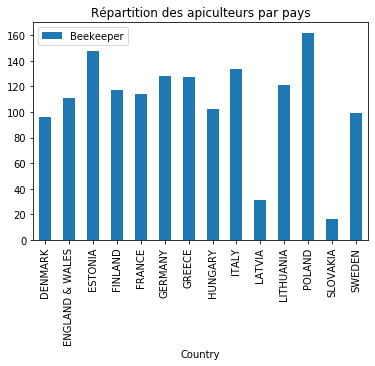

In [166]:
_=data.plot.bar(x = "Country", y = "Beekeeper", title = "Répartition des apiculteurs par pays")

## Répartition des apiculteurs selon l'activité

In [89]:
data = pd.read_csv("requetes/resultats/nb_activity.csv", sep = ";", names = ["Activity", "Beekeeper"], na_values = '' )

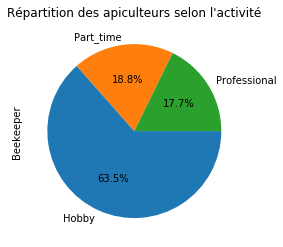

In [90]:
_=data.plot(kind='pie', y = 'Beekeeper', labels=data['Activity'], legend = False, autopct='%1.1f%%', counterclock = False, title = "Répartition des apiculteurs selon l'activité")

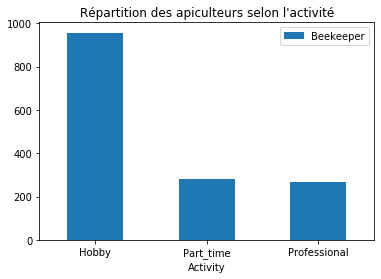

In [92]:
_=data.plot.bar(x = "Activity", y = "Beekeeper", rot=0, title = "Répartition des apiculteurs selon l'activité")

$\implies$ même proportion de professionnels et de mi-temps mais sureprésentation d'amateurs.

## Apiculteurs selon l'activité et l'âge

In [86]:
data = pd.read_csv("requetes/resultats/beekeeper_age_activ.csv", sep = ";", names = ["Activity", "Age", "Beekeeper"], na_values = '' )

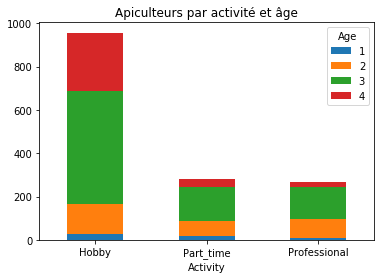

In [87]:
_=data.groupby(['Activity','Age']).sum().unstack().plot(kind='bar',y='Beekeeper', stacked=True, rot = 0, title = "Apiculteurs par activité et âge")

$\implies$ globalement le profil classique d'un apiculteur est d'appartenir à la classe d'âge 3. En proportion on retrouve plus d'apiculteurs de plus de 65 ans et de moins de 25 ans chez les amateurs ce qui peut s'expliquer par le fait qu'il s'agit d'une activité faite sur le temps libre. La classe d'âge 3 est plus représentative de la population active ce qui peut expliquer que cette catégorie soit sureprésentée chez les mi-temps et professionnels.

## Apiculteurs selon l'activité et l'expérience

Les plus âgés sont-ils les plus expérimentés ? Ou est-ce les professionnels ?

In [122]:
data = pd.read_csv("requetes/resultats/beekeeper_acti_exp.csv", sep = ";", names = ["Activity", "Experience", "Beekeeper"], na_values = '' )

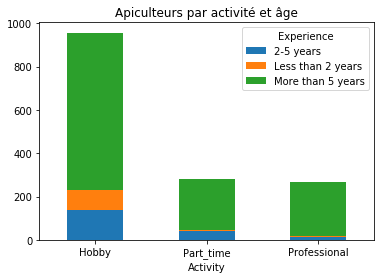

In [124]:
_=data.groupby(['Activity','Experience']).sum().unstack().plot(kind='bar',y='Beekeeper', stacked=True, rot = 0, title = "Apiculteurs par activité et âge")

In [128]:
proportion = [725/(725+93+138), 236/(236+5+42), 251/(251+1+15)]
proportion # pourcentage apiculteurs avec le plus d'expérience par activité

[0.7583682008368201, 0.833922261484099, 0.9400749063670412]

$\implies$ pour pouvoir conclure nous devons considérer les proportions respectives selon le type d'activité. Nous voyons que c'est chez les professionnels que l'on trouve le plus d'apiculteurs expérimentés. Ce résultat est cohérent car il s'agit de leur profession : on peut s'attendre à ce qu'ils l'exercent depuis plus longtemps et de façon plus sérieuse sur la durée. En général plus un apiculteur exerce de façon professionnelle plus son expérience grandit.

## Taille de la population d'abeilles selon l'activité

Pour quelle catégorie d'apiculteurs y-a-t'il le plus de danger ?

In [96]:
data = pd.read_csv("requetes/resultats/bee_pop_size_act.csv", sep = ";", names = ["Activity", "Bee_population_size"], na_values = '' )

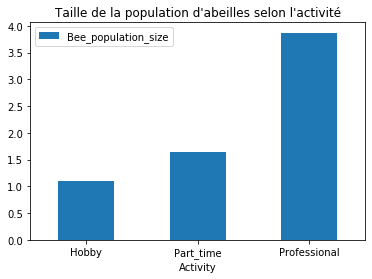

In [95]:
_=data.plot.bar(x = "Activity", y = "Bee_population_size", rot=0, title = "Taille de la population d'abeilles selon l'activité")

$\implies$ comme attendu la taille de la population augmente avec la "professionnalisation" de l'activité. Cette augmentation est proche d'un facteur 2 entre les professionnels et les autres catégories. Il faut s'attendre à ce que la présence d'une forte mortalité et de maladies soit plus inquiétante si elle est détectée chez des professionnels car elle concerne une plus grande proportion d'abeilles.

## Lien entre dépopulation chronique et mortalité

In [191]:
data = pd.read_csv("requetes/resultats/lien_chronic_mortalite.csv", sep = ";", names = ["Depopulation", "Mortality"], na_values = '' )

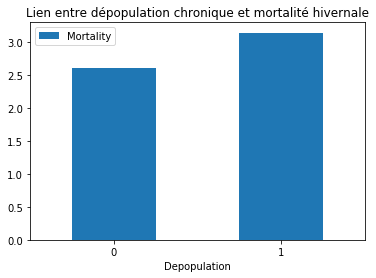

In [192]:
_=data.plot.bar(x = "Depopulation", y = "Mortality", rot=0, title = "Lien entre dépopulation chronique et mortalité hivernale")

$\implies$ la dépopulation chronique semble liée à une plus forte mortalité. Nous pouvons supposer que la saison hivernale étant essentielle pour l'année à venir une mauvaise saison soit à l'origine de troubles de santé chez les abeilles. Dans les cas où nous aurons une forte mortalité nous pourrons émettre l'hypothèse que les apiculteurs risquent de pâtir de dépopulation chronique par la suite. Et nous ne pouvons pas éliminer l'hypothèse que les deux phénomènes s'auto entretiennent ensuite (cercle vicieux). Les professionnels ayant de plus grosses populations d'abeilles ont donc tout intérêt à éviter ça.

## Proportion d'apiculteurs présentant une formation selon l'activité

Nous savons à présent que l'activité est liée à l'expérience.

In [129]:
data = pd.read_csv("requetes/resultats/training_activ.csv", sep = ";", names = ["Activity", "Training", "Beekeeper"], na_values = '' )

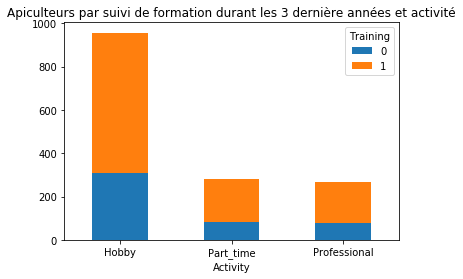

In [131]:
_=data.groupby(['Activity','Training']).sum().unstack().plot(kind='bar',y='Beekeeper', stacked=True, rot = 0, title = "Apiculteurs par suivi de formation durant les 3 dernière années et activité")

In [134]:
proportion = [645/(645+311), 202/(202+81), 189/(189+78)]
proportion # proportion apiculteurs avec formation selon activité

[0.6746861924686193, 0.7137809187279152, 0.7078651685393258]

$\implies$ différence peu significative. Une tendance semble se dessiner : plus l'activité est professionnelle et plus l'apiculteur a subi une formation durant les 3 dernière années.

## Proportion d'apiculteurs présentant une formation selon l'âge

In [97]:
data = pd.read_csv("requetes/resultats/training_age.csv", sep = ";", names = ["Training", "Age", "Beekeeper"], na_values = '' )

$\implies$ les apiculteurs les plus jeunes ont en moyenne moins suivi de formation que les autres, et la classe d'âge 3 est nettement celle dans laquelle les apiculteurs ont le plus suivi de formation. Il faut faire attention car la classe d'âge 3 est aussi la classe la plus représentée, nous devons donc calculer les proportions.

In [101]:
data = pd.read_csv("requetes/resultats/beekeeper_age_training.csv", sep = ";", names = ["Training", "Age", "Beekeeper"], na_values = '' )

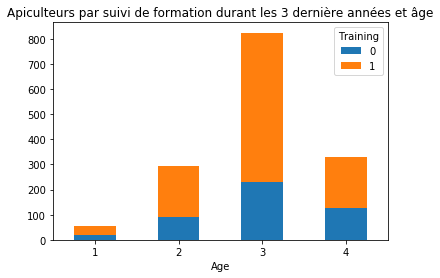

In [103]:
_=data.groupby(['Age','Training']).sum().unstack().plot(kind='bar',y='Beekeeper', stacked=True, rot = 0, title = "Apiculteurs par suivi de formation durant les 3 dernière années et âge")

In [121]:
proportion = [35/(21+35), 204/(204+90), 593/(593+232), 204/(204+127)]
proportion # pourcentage apiculteurs avec formation par classe d'âge

[0.625, 0.6938775510204082, 0.7187878787878788, 0.6163141993957704]

$\implies$ à présent nous pouvons analyser : une tendance se dessinent chez les apiculteurs des classes 2, 3 et 4 d'âges qui présentent une plus forte proportion d'apiculteurs avec formation. En calculant les proportions respectives selon les classes nous voyons qu'elles sont relativement plus importantes dans les classes 2 et 3 (autour de 70% des apiculteurs ont une formation). Un tel résultat peut s'expliquer par le fait que la classe 3 est celle dans laquelle on retrouve une plus grande proportion de professionnels, qui vont s'investir davantage.

## Lien entre qualification et formation

In [140]:
data = pd.read_csv("requetes/resultats/lien_qualif_training.csv", sep = ";", names = ["Training", "Qualification", "Beekeeper"], na_values = '' )

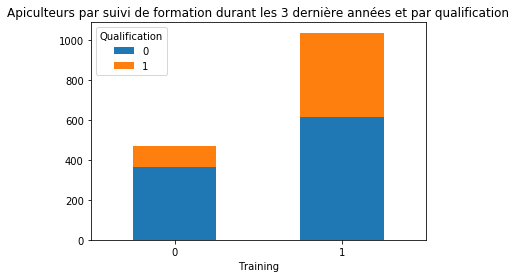

In [141]:
_=data.groupby(['Training','Qualification']).sum().unstack().plot(kind='bar',y='Beekeeper', stacked=True, rot = 0, title = "Apiculteurs par suivi de formation durant les 3 dernière années et par qualification")

$\implies$ nous pouvons voir que les apiculteurs ayant suivi une formation durant les 3 dernière années sont aussi plus nombreux à cumuler une qualification officielle. La corrélation peut être révélatrice d'un investissement plus important dû au type d'activité exercée ou de la poursuite de la formation d'apiculteur.

## Lien entre participation à une coopérative et formation

In [142]:
data = pd.read_csv("requetes/resultats/lien_coop_training.csv", sep = ";", names = ["Training", "Cooperative", "Beekeeper"], na_values = '' )

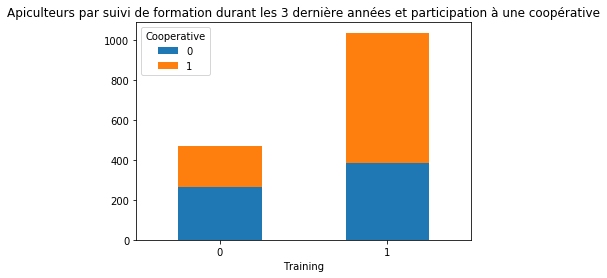

In [143]:
_=data.groupby(['Training','Cooperative']).sum().unstack().plot(kind='bar',y='Beekeeper', stacked=True, rot = 0, title = "Apiculteurs par suivi de formation durant les 3 dernière années et participation à une coopérative")

$\implies$ les apiculteurs ayant suivi une formation durant les 3 dernières années sont aussi ceux qui présentent plus d'implication en proportion dans les coopérative de traitement. Nous savons que les professionnels sont plus nombreux à avoir eu une formation et une qualification, il était cohérent de retrouver cette population plus impliquée (prévention, investissement).

## Lien entre participation à une coopérative de traitement et présence de Varroa

Les apiculteurs s'engagent-ils car ils souffrent davantage de Varroa ou par prévention ?

## Lien entre présence de varroa et mortalité hivernale

La détection du Varroa permet-elle de réduire la mortalité pouvant être engendrée par l'infection ? La prévention fonctionne-t-elle ? Ou est-ce la représentation d'un fléau ?

### Effet du Varroa sur la mortalité hivernale

Etude de la répartition du Varroa :

In [144]:
data = pd.read_csv("requetes/resultats/pays_varroa.csv", sep = ";", names = ["Country", "Disease", "Varroa"], na_values = '' )

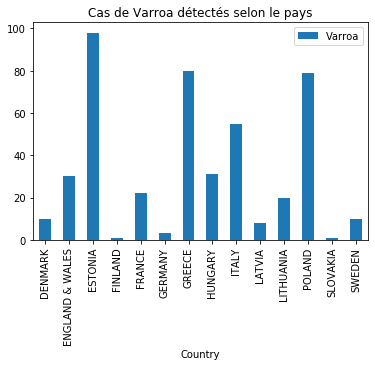

In [146]:
_=data.plot.bar(x = "Country", y = "Varroa", title = "Cas de Varroa détectés selon le pays")

$\implies$ l'Estonie, la Grèce et la Pologne sont les plus touchés.

La mortalité est-elle plus élevée dans ces pays ?

In [149]:
mortality_Varroa = 3.3061 + 2.3125 + 3.2911
mortality_noVarroa = 3.2800 + 1.7826 + 3.2289
print("Mortalité moyenne avec Varroa =", np.mean(mortality_Varroa))
print("Mortalité moyenne sans Varroa =", np.mean(mortality_noVarroa))

Mortalité moyenne avec Varroa = 8.9097
Mortalité moyenne sans Varroa = 8.2915


$\implies$ la mortalité semble plus élevée dans les pays les plus touchés (7%), le Varroa a donc un effet significatif sur la mortalité hivernale.

### Les apiculteurs membres de coopérative de traitement ont-ils plus de cas globalement ?

In [151]:
data = pd.read_csv("requetes/resultats/lien_coop_suffering.csv", sep = ";", names = ["Cooperative", "Varroa"], na_values = '' )

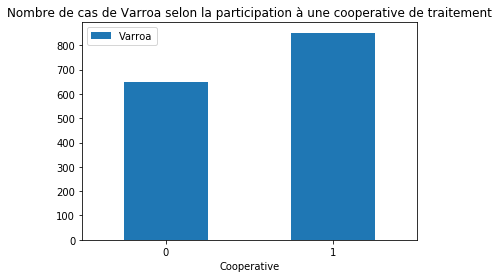

In [152]:
_=data.plot.bar(x = "Cooperative", y = "Varroa", rot=0, title = "Nombre de cas de Varroa selon la participation à une cooperative de traitement")

$\implies$ globalement il y a d'avantage de cas de Varroa détectés (30% de plus, ce qui est non négligeable) lorsque les apiculteurs sont membre d'une coopérative de traitement. Est-ce un indicateur d'une meilleure capacité de détection ou d'un effort de lutte contre le Varroa ?

### Les apiculteurs membres de coopérative de traitement dans les zones les plus touchées ont-ils plus de cas ?

Ces cas seront révélateurs : détectent-ils mieux ou souffrent-ils plus de Varroa et donc s'investissent pour en venir à bout ?

In [160]:
data = pd.read_csv("requetes/resultats/estonia_casVarroa.csv", sep = ";", names = ["Cooperative", "Varroa"], na_values = '' )

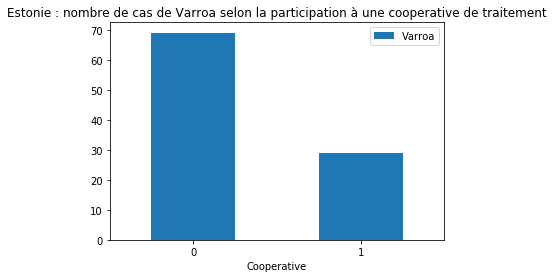

In [161]:
_=data.plot.bar(x = "Cooperative", y = "Varroa", rot=0, title = "Estonie : nombre de cas de Varroa selon la participation à une cooperative de traitement")

In [162]:
data = pd.read_csv("requetes/resultats/greece_casVarroa.csv", sep = ";", names = ["Cooperative", "Varroa"], na_values = '' )

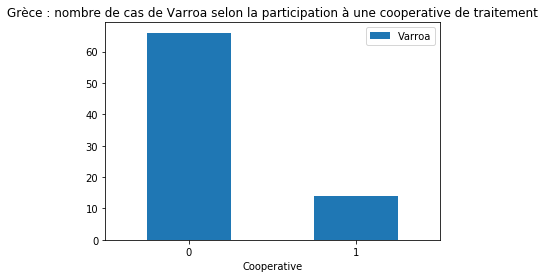

In [163]:
_=data.plot.bar(x = "Cooperative", y = "Varroa", rot=0, title = "Grèce : nombre de cas de Varroa selon la participation à une cooperative de traitement")

$\implies$ la tendance globale n'était pas révélatrice : il faut prendre les cas les plus touchés pour "isoler" l'effet du ver Varroa. Nous voyons à présent qu'il y a clairement moins de cas détectés dans le cas où les apiculteurs sont membres d'une coopérative de traitement. Les deux zones étudiées étant les plus touchées par le Varroa nous pouvons poser l'hypothèse que ce fléau de Varroa explique l'effort de lutte et donc l'implication dans des coopératives, qui se révèle être un bon moyen de prévenir/guérir les colonies. Il faut toutefois rester prudent car bien que ces 2 pays comptent les plus grands nombre d'apiculteurs (voir graphique 1), nous n'avons malgré tout accès qu'à un faible échantillon pour analyser (2 pays c'est trop faible tirer des conclusions, nous devons nous en tenir à des hypothèses). 

### Les apiculteurs dans les zones les plus touchées sont-ils plus nombreux dans des coopératives de traitement ?

In [167]:
data = pd.read_csv("requetes/resultats/lien_coop_pays.csv", sep = ";", names = ["Country", "Cooperative", "Beekeeper"], na_values = '' )

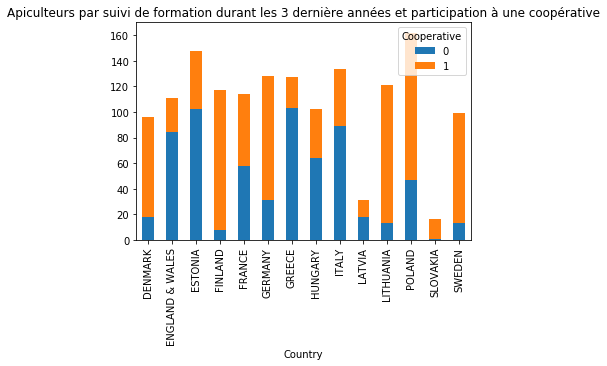

In [169]:
_=data.groupby(['Country','Cooperative']).sum().unstack().plot(kind='bar',y='Beekeeper', stacked=True, title = "Apiculteurs par suivi de formation durant les 3 dernière années et participation à une coopérative")

$\implies$ si nous regardons les 3 pays les plus atteints il n'y a pas de tendance qui se dessine, nous ne pouvons pas conclure (de façon inattendue en Estonie et en Grèce les apiculteurs sont moins nombreux à être membres de coopératives alors qu'en Pologne il y en a nettement plus). Nous ne pouvons conclure quant à un lien entre pays touchés et investissement dans une coopérative.

### Les apiculteurs membres de coopérative de traitement dans les zones les plus touchées ont-ils moins de mortalité que les non membres ?

Traitent-ils mieux les cas ? Font-ils plus de prévention ? Sont-ils submergés de cas ce qui expliquent leur inscription dans une coopérative ?

In [172]:
data = pd.read_csv("requetes/resultats/mortalite_coope.csv", sep = ";", names = ["Cooperative", "Country", "Mortality"], na_values = '' )

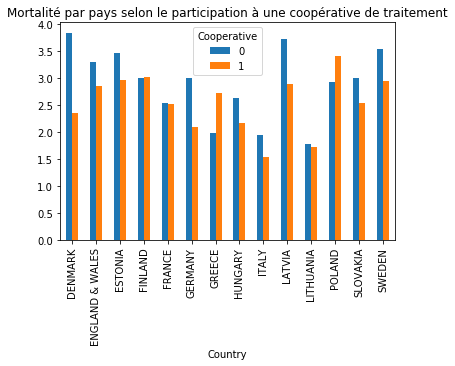

In [179]:
_=data.groupby(['Country','Cooperative']).sum().unstack().plot(kind='bar', y="Mortality", title = "Mortalité par pays selon le participation à une coopérative de traitement")

$\implies$ nous savons qu'il y a plus d'apiculteurs membres de coopératives dans les pays les plus touchés (Estonie, Pologne, Grèce). Nous voyons qu'en Pologne et en Grèce la mortalité est plus forte lorsque les apiculteurs sont membres de coopérative alors qu'en Estonie c'est l'inverse. De tels résultats ne permettent pas de conclure. Nous pouvons penser que la participation à une coopérative n'a pas d'effet sur la mortalité hivernale (car l'effet du Varroa n'était pas très significatif sur la mortalité, donc ce facteur seul ne permet pas de contrer une forte mortalité) ou bien que les apiculteurs les plus atteints sont membres (pas encore de retour sur investissement, ils luttent contre le Varroa qui tue leurs abeilles ce qui explique la mortalité plus forte).

## Lien entre mortalité hivernale et expérience

In [186]:
data = pd.read_csv("requetes/resultats/lien_mortalite_exp.csv", sep = ";", names = ["Experience", "Mortality"], na_values = '' )

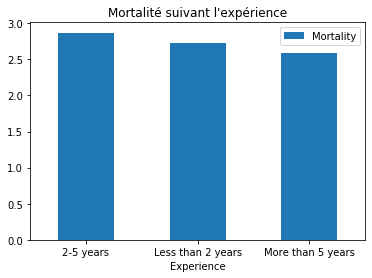

In [188]:
_=data.plot.bar(x = "Experience", y = "Mortality", rot=0, title = "Mortalité suivant l'expérience")

$\implies$ l'expérience semble corrélée à la diminution de la mortalité hivernale. Nous pouvons supposer que l'expérience fait que les apiculteurs savent mieux se préparer à l'hiver, nous pouvons aussi supposer que la majorité des expérimentés étant des professionnels  s'ajoute l'investissement (l'enjeu de prendre bien soin de la population d'abeilles est plus important).

## Lien entre mortalité hivernale et formation

Nous allons regarder si la formation peut avoir un effet sur la mortalité : un apiculteur formé sait-il mieux passer l'hiver ? Est-ce un bon retour sur investissement ?

In [184]:
data = pd.read_csv("requetes/resultats/lien_mortalite_training.csv", sep = ";", names = ["Training", "Mortality"], na_values = '' )

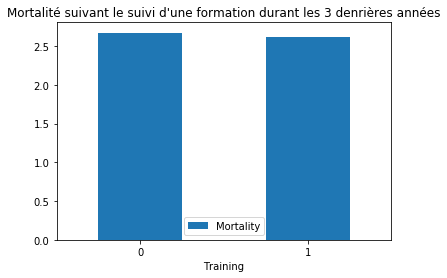

In [185]:
_=data.plot.bar(x = "Training", y = "Mortality", rot=0, title = "Mortalité suivant le suivi d'une formation durant les 3 denrières années")

$\implies$ la différence est négligeable, la formation ne semble pas avoir d'effet sur la mortalité. L'expérience a plus d'effet que la formation. Hypothèse : l'hiver est une période très critique pour les abeilles, nous pouvons supposer qu'expérimenter est plus déterminant.

## Lien entre mortalité hivernale et la qualification

In [193]:
data = pd.read_csv("requetes/resultats/lien_qualif_mortalite.csv", sep = ";", names = ["Qualification", "Mortality"], na_values = '' )

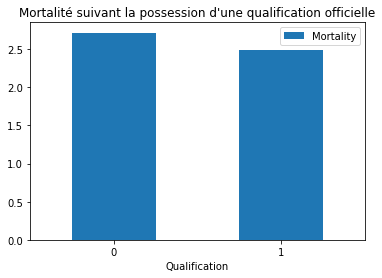

In [194]:
_=data.plot.bar(x = "Qualification", y = "Mortality", rot=0, title = "Mortalité suivant la possession d'une qualification officielle")

$\implies$ les apiculteurs avec une qualification semblent présenter une plus faible mortalité (10%). La qualification officielle est-elle plus sérieuse ou de meilleure qualité ? Peut-on supposer qu'une formation durant les 3 dernières années est moins pertinente (trop récente pour avoir un retour sur investissement, ou de moins bonne qualité). 

## Lien entre mortalité hivernale et combinaison expérience et qualification

Seule la qualification officielle et l'expérience semblent être décisives pour la mortalité hivernale.

L'expérience permet-elle de pallier l'absence de qualification ?

In [199]:
data = pd.read_csv("requetes/resultats/lien_qualif_exp.csv", sep = ";", names = ["Experience", "Qualification", "Mortality", "Disease", "Beekeeper"], na_values = '' )

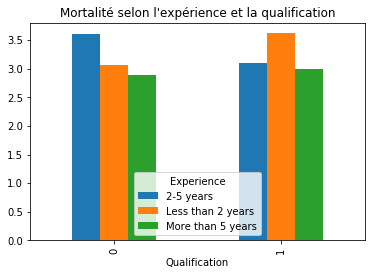

In [201]:
_=data.groupby(['Qualification','Experience']).sum().unstack().plot(kind='bar', y="Mortality", title = "Mortalité selon l'expérience et la qualification")

$\implies$ lorsque l'apiculteur peu expérimenté et sans qualification présente la mortalité plus haute ce qui était attendu (le soin n'est pas apporté ou pas apporté correctement par manque de connaissances). Lorsque l'apiculteur n'a pas de qualification nous observons un effet de l'expérience sur la mortalité hivernale qui est d'autant plus faible que l'expérience augmente : l'expérience permet de pallier l'absence de formation. <br><br>
Lorsque l'apiculteur est peu expérimenté et avec une qualification la mortalité est bien moins élevée qu'en l'absence de formation : la qualification peut pallier le manque d'expérience dans le cas où l'apiculteur à entre 2 à 5 ans d'expériences. <br><br>
La combinaison expérience et qualification n'est surprenamment pas décisive, lorsque l'apiculteur est expérimenté la qualification n'a pas d'influence.

## Lien entre mortalité hivernale et combinaison expérience, âge, et qualification

Peut-on identifier un profil (cluster) intéressant pour le bon maintien de la population d'abeilles ?

In [203]:
data = pd.read_csv("requetes/resultats/total.csv", sep = ";", names = ["Mortality", "Experience", "Qualification", "Age", "Activity"], na_values = '' )

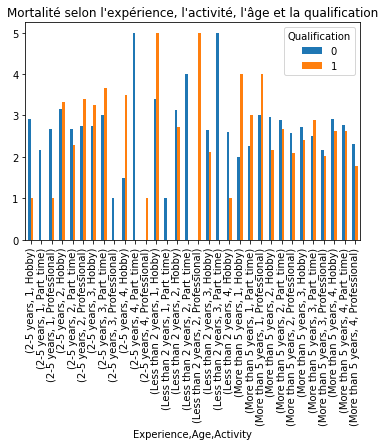

In [209]:
_=data.groupby(['Experience','Age', 'Activity', 'Qualification']).sum().unstack().plot(kind='bar', y="Mortality", title = "Mortalité selon l'expérience, l'activité, l'âge et la qualification")

$\implies$ la mortalité la plus faible est atteinte dans un cluster des professionnels de la classe d'âge 2, avec une qualification.

## Attention lien entre mortalité hivernale et localisation géographique

Les observations et hypothèses que nous avons pu faire se heurtent au fait que nous pouvons rationnellement supposé qu'il existe un lien entre mortalité hivernale et localisation géographique. Une telle corrélation viendrait influencer l'ordre de grandeur de la mortalité et ne nous permettrait pas de conclure. Pour étudier les effets séparés de la formation, de l'expérience ou de la qualification il faudrait s'y soustraire, sinon les résultats sont faussés.

In [180]:
data = pd.read_csv("requetes/resultats/lien_mortalite_pays.csv", sep = ";", names = ["Country", "Mortality"], na_values = '' )

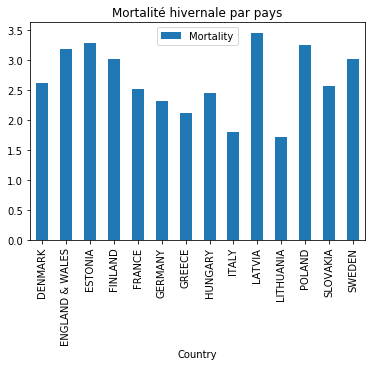

In [181]:
_=data.plot.bar(x = "Country", y = "Mortality", title = "Mortalité hivernale par pays")

Les pays les plus nordiques tels que la Lituanie, Pologne, Lettonie, Estonie, Royaume-Uni, Suède présentent très clairement les plus hautes mortalités, à l'opposé des pays du Sud. Comme attendue il y a bien un lien entre mortalité hivernale et position géographique ce qui est cohérent (climat). Nous devons d'autant plus être prudents concernant nos observations au regard de cette corrélation.
Il est donc possible qu'il y ait un lien entre formation et bon maintien de la population d'abeilles par exemple mais qu'il n'ait pas été visible.